<a href="https://colab.research.google.com/github/hanasgnt/PCVK_2024_14/blob/main/week5_14.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Nama  : Hana Sugianto

NIM   : 2241720102

Kelas : 3E

**# No 0. Connect drive**

In [ ]:
from google.colab import drive

# Akses google drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**# No 1. Buat Gamma Correction**

In [ ]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pylab as plt
import numpy as np
import copy

 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 3


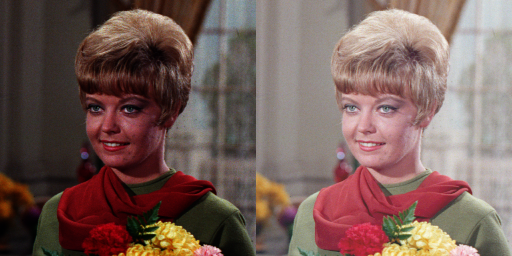

In [ ]:
print(' Gamma Correction pada citra ')
print('----------------------------------')
try:
  gamma = int(input('Masukkan nilai Gamma: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK_2024/image/female.tiff')
gama_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      gama_image[y,x,c] = 255*(original[y,x,c]/255)**(1/gamma)

final_frame = cv.hconcat((original, gama_image))
cv2_imshow(final_frame)

**# No 2. Buat Simulasi Image Depth**

Bit Depth pada citra 
----------------------------------
Masukkan nilai Bit Depth: 2


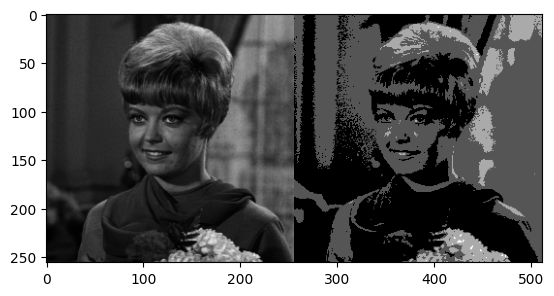

In [ ]:
print('Bit Depth pada citra ')
print('----------------------------------')
try:
  bit_depth = int(input('Masukkan nilai Bit Depth: '))
except ValueError:
  print('Error, not a number')

level = 255 / (pow(2, bit_depth)-1)
original = cv.imread('/content/drive/MyDrive/PCVK_2024/image/female.tiff', cv.IMREAD_GRAYSCALE)
depth_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    depth_image[y,x] = np.clip(round(original[y,x]/level)*level, 0, 255)

final_frame = cv.hconcat((original, depth_image))
plt.imshow(final_frame, cmap='gray')

**# No 3. Buat Modul Average**

In [ ]:
import glob
import pandas as pd
from math import log10, sqrt

In [ ]:
# Fungsi untuk menghitung PSNR
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0: # MSE 0 maka tidak ada noise sama sekali, sehingga PSNR tidak memiliki arti
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr, mse

Jumlah Citra: 5, PSNR: 27.54 dB


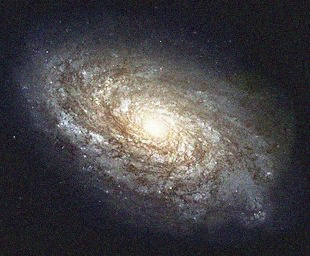

Jumlah Citra: 10, PSNR: 27.55 dB


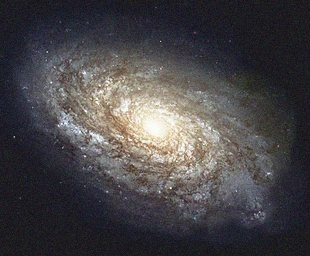

Jumlah Citra: 20, PSNR: 27.53 dB


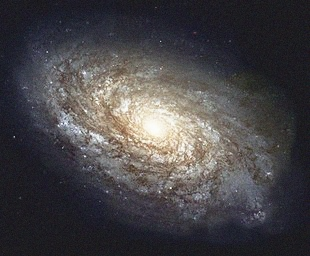

Jumlah Citra: 40, PSNR: 27.46 dB


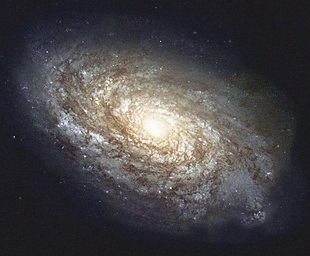

Jumlah Citra: 80, PSNR: 27.40 dB


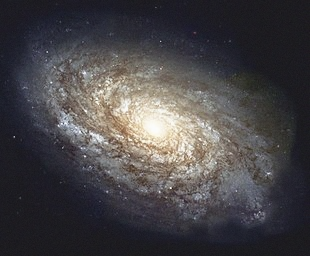

Jumlah Citra: 100, PSNR: 27.37 dB


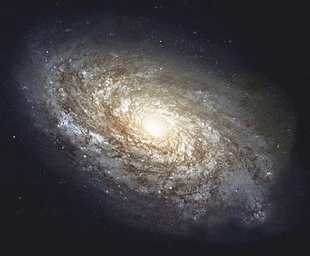

In [ ]:
original_img = cv.imread('/content/drive/MyDrive/PCVK_2024/images/galaxy.jpg')
count = 0
cv_img = []
data = []
for img in glob.glob('/content/drive/MyDrive/PCVK_2024/images/noises/*.jpg'):
    n = cv.imread(img)
    cv_img.append(n)

average_counts = [5, 10, 20, 40, 80, 100]

# Loop untuk proses denoising
for count in average_counts:
    denoised_image = np.zeros(cv_img[0].shape, dtype=np.float32)

    # Menjumlahkan citra
    for i in range(count):
        denoised_image += cv_img[i].astype(np.float32)

    # Normalisasi untuk mendapatkan citra denoised
    denoised_image = np.uint8(denoised_image / count)

    # Menghitung nilai PSNR
    psnr, mse_value = PSNR(original_img, denoised_image)
    data.append({"Jumlah Citra": count, "PSNR (dB)": psnr, "MSE": mse_value})

    print(f"Jumlah Citra: {count}, PSNR: {psnr:.2f} dB")

    cv2_imshow(denoised_image)
    cv.waitKey(0)  # Tekan sembarang tombol untuk lanjut

In [ ]:
# Membuat DataFrame dari data yang dikumpulkan
df = pd.DataFrame(data)

# Tampilkan tabel
print("\nTabel Hasil Denoising:")
print(df)


Tabel Hasil Denoising:
   Jumlah Citra  PSNR (dB)         MSE
0             5  27.536621  114.661668
1            10  27.549539  114.321127
2            20  27.526621  114.925987
3            40  27.460327  116.693775
4            80  27.403662  118.226323
5           100  27.370931  119.120699


**Kesimpulan yg dapat diambil 🐾**



Nilai PSNR menunjukkan kualitas citra setelah proses denoising. Semakin tinggi nilai PSNR, semakin baik kualitas citra. Dalam tabel, terlihat bahwa PSNR sedikit bervariasi dengan jumlah citra, dengan nilai tertinggi sebesar 27.549539 dB untuk 10 citra dan nilai terendah 27.370931 dB untuk 100 citra.
Ini menunjukkan bahwa menambah jumlah citra tidak selalu meningkatkan kualitas citra denoising secara signifikan. Tingginya nilai PSNR berbanding terbalik dengan nilai MSE.


**# No 4. Buat Image Masking**

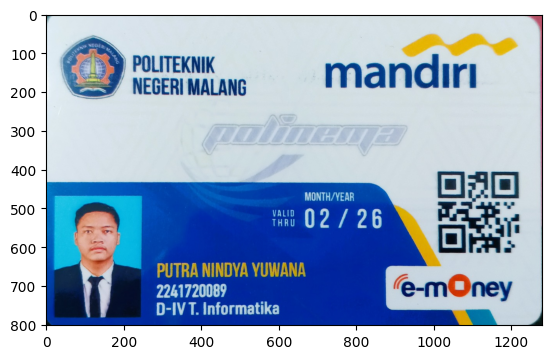

In [ ]:
img = cv.imread('/content/drive/MyDrive/PCVK_2024/image/ktm_putrayuwana.jpg')
photo = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.imshow(photo)

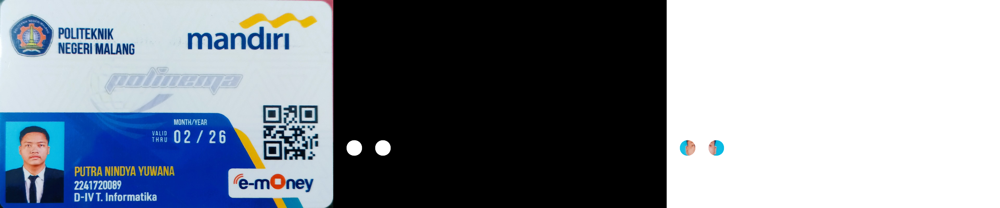

In [ ]:
mask = np.zeros(img.shape, img.dtype)
mask = cv.circle(mask, (80, 570), 30, (255,255,255), -1)

mask2 = np.zeros(img.shape, dtype=np.uint8)
mask2 = cv.circle(mask,(190, 570), 30, (255,255,255), -1)

result = img & mask & mask2
result[mask==0] = 255
final_frame = cv.hconcat((img, mask, result))
cv2_imshow(final_frame)

**# No 5. Percobaan menggunakan operator lain**

In [ ]:
mask = np.zeros(img.shape, img.dtype)
mask = cv.circle(mask, (80, 570), 30, (255,255,255), -1)

mask2 = np.zeros(img.shape, dtype=np.uint8)
mask2 = cv.circle(mask,(190, 570), 30, (255,255,255), -1)

# Operasi AND
result_and = img & mask
result_and[mask == 0] = 255

# Bitwise NOT
result_not = ~img

# Bitwise OR
result_or = img | mask2

# Bitwise NAND
result_nand = ~(img & mask2)

# Bitwise XOR
result_xor = img ^ mask2

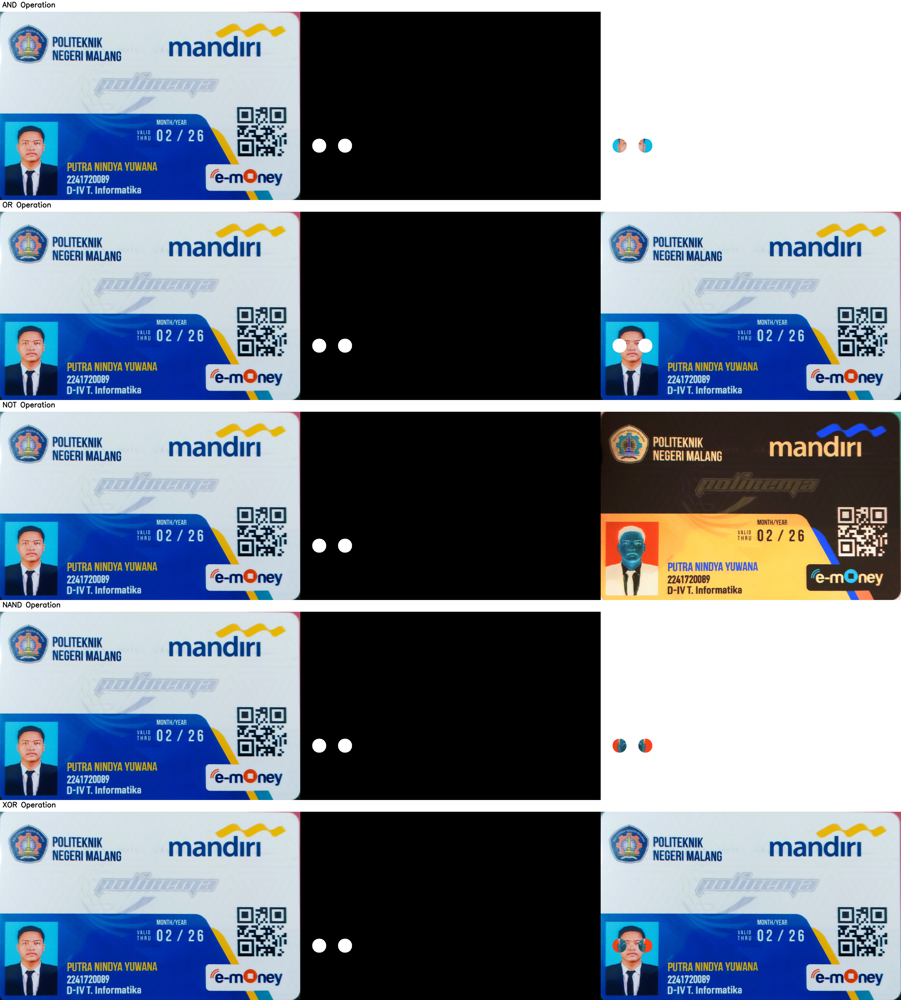

In [ ]:
# Fungsi untuk menambahkan teks judul pada gambar
def add_title(image, title):

    width = image.shape[1]
    title_frame = np.zeros((50, width, 3), dtype=np.uint8)
    title_frame[:] = (255, 255, 255)

    cv.putText(title_frame, title, (10, 30), cv.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 2, cv.LINE_AA)

    # Menggabungkan frame judul dengan gambar
    return cv.vconcat([title_frame, image])

# Menambah judul pada setiap frame hasil operasi
final_and_frame = add_title(cv.hconcat((img, mask2, result_and)), 'AND Operation')
final_or_frame = add_title(cv.hconcat((img, mask2, result_or)), 'OR Operation')
final_not_frame = add_title(cv.hconcat((img, mask2, result_not)), 'NOT Operation')
final_nand_frame = add_title(cv.hconcat((img, mask2, result_nand)), 'NAND Operation')
final_xor_frame = add_title(cv.hconcat((img, mask2, result_xor)), 'XOR Operation')

all_results_frame = cv.vconcat((final_and_frame, final_or_frame, final_not_frame, final_nand_frame, final_xor_frame))
cv2_imshow(all_results_frame)

**Hasil analisa 🐾**



Pada percobaan di atas ada image asli dan masking, dimana yang membedakan hanya ooperasinya, berupa and, or, not, dll.

*   ketika operasi not; menampilkan image dalam bentuk negatifnya

*   ketika operasi or; Menggabungkan gambar asli dengan masker, di mana area yang putih dalam masker akan menutupi bagian gambar di bawahnya

*   ketika operasi and; menyatukan gambar asli dan masker dengan menampilkan hanya area irisan (tumpang tindih). Dalam konteks foto KTM, hanya bagian telinga yang ditampilkan jika itu yang terletak di dalam area masker

*   ketika operasi nand; menghasilkan hasil negatif dari operasi AND.

*   ketika operasi xor; menampilkan image asli dimana posisi irisan image dengan mask akan menampilkan hasil negatif dari image ktm.